# Libraries

In [1]:
# === Standard Libraries ===
import os
import re
import gzip
import gc
import argparse
from functools import partial
from itertools import product
from pathlib import Path

# ===  Data ===
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad

# === Plotting ===
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import matplotlib.image as mpimg
from matplotlib.colorbar import Colorbar
import matplotlib.lines as mlines
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
import matplotlib.gridspec as gridspec
from skimage.filters import threshold_otsu
from skimage import measure, morphology
from matplotlib.colors import LinearSegmentedColormap

# === Image Processing ===
from PIL import Image
Image.MAX_IMAGE_PIXELS = None
from skimage.filters import threshold_otsu
from skimage import measure, morphology

import skimage
import skimage.io
import skimage.color
import skimage.exposure
from skimage.color import rgb2gray
from skimage.transform import rescale

# === Other ===
import svgwrite
import pkg_resources
import matplotlib as mpl

# === PyTorch ===
import torch
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import Dataset


# Paths

In [2]:
import os

# Raw data and images

print(os.getcwd()) 

raw_data_dir = "/home/jesu3424/EmpiricalBayes/cebmf_seqRNA/data/chevrier/h5ad"

# MOBs (F2)
MOB1_dir = os.path.join(raw_data_dir, "MOB_1")
MOB3_dir = os.path.join(raw_data_dir, "MOB_3")

# Kidneys (F3)
KI1_dir = os.path.join(raw_data_dir, "AS_KI_1")
KI2_dir = os.path.join(raw_data_dir, "AS_KI_2")
KI3_dir = os.path.join(raw_data_dir, "AS_KI_3")
KI4_dir = os.path.join(raw_data_dir, "AS_KI_4")

# HE images
HE_dir = "/home/jesu3424/EmpiricalBayes/cebmf_seqRNA/data/chevrier/images/Downsampled/"


/home/jesu3424/EmpiricalBayes/cebmf_seqRNA


In [3]:
import os
import shutil

# Organize data to share
dest_dir = "/home/jesu3424/EmpiricalBayes/cebmf_seqRNA/data/chevrier/images/Destination/"

subdirs = [HE_dir]
print(subdirs)

os.makedirs(dest_dir, exist_ok=True)
print(dest_dir)

# Copy files
for subdir in subdirs:
    for file_name in os.listdir(subdir):
        print(file_name)
        src_path = os.path.join(subdir, file_name)
        dst_path = os.path.join(dest_dir, file_name)
        if os.path.isfile(src_path):
            shutil.copy2(src_path, dst_path)  

['/home/jesu3424/EmpiricalBayes/cebmf_seqRNA/data/chevrier/images/Downsampled/']
/home/jesu3424/EmpiricalBayes/cebmf_seqRNA/data/chevrier/images/Destination/
MOB_3.png
AS_KI_3.png
AS_KI_2.png
MOB_1.png
AS_KI_4.png
AS_KI_1.png


# Functions

In [4]:
import os, glob
import numpy as np
import skimage.io, skimage.color, skimage.exposure
from skimage import img_as_float32

# Load greyscale image
def _resolve_image_path(image_dir, sample, exts=(".png", ".tif", ".tiff", ".jpg", ".jpeg")):

    for ext in exts:
        p = os.path.join(image_dir, f"{sample}{ext}")
        if os.path.exists(p):
            return p
    hits = []
    for ext in exts:
        hits.extend(glob.glob(os.path.join(image_dir, f"{sample}*{ext}")))
    return hits[0] if hits else None

def load_grayscale_images(samples, image_dir, percentiles=(0, 55)):
    images = {}
    for sample in samples:
        path = _resolve_image_path(image_dir, sample)
        if path is None:
            raise FileNotFoundError(f"No image found for sample '{sample}' in {image_dir}")
        img = skimage.io.imread(path)

        # Handle grayscale, RGB, RGBA
        if img.ndim == 2:
            gray = img
        elif img.ndim == 3:
            if img.shape[2] == 4:
                img = skimage.color.rgba2rgb(img)
            gray = skimage.color.rgb2gray(img)
        else:
            raise ValueError(f"Unexpected image shape {img.shape} for '{sample}'")

        gray = img_as_float32(gray)

        if percentiles is not None:
            low, high = np.percentile(gray, percentiles)
            print(f"Low and high percentiles for '{sample}' before if statement: {low}, {high}")
            if not np.isfinite(low) or not np.isfinite(high) or high <= low:
                low, high = np.min(gray), np.max(gray)
                print(f"Low and high percentiles for '{sample}' after if statement: {low}, {high}")
            gray = skimage.exposure.rescale_intensity(gray, in_range=(low, high))

        images[sample] = gray

        print(f"Loaded image for sample '{sample}' with shape {gray.shape}")

    print(f"Loaded {len(images)} images.")
    print(f"Samples with images: {list(images.keys())}")

    return images

def distinct_palette(labels, s=0.9, v=0.9):

    labels = sorted(list(labels))
    n = len(labels)
    print(f"{n} distinct labels found.")
    hues = np.linspace(0, 1, n, endpoint=False)
    colors = [mpl.colors.hsv_to_rgb((h, s, v)) for h in hues]
    return {lab: colors[i] for i, lab in enumerate(labels)}

# Plot a cell type column over greyscale H&E
def plot_celltype_on_HE(
    adata,
    cell_filter,
    celltype_col,
    output_path,
    image_dir,
    point_size=1,
    title="",
    legend_title=None,
    fixed_palette=None,
    sample_col="Sample_ID",
    x_col="x_scaled_image",
    y_col="y_scaled_image",
    title_fs=7, axis_label_fs=6, tick_fs=6,
    legend_fs=6, legend_title_fs=6, legend_markersize=4
):
    # Subset
    if cell_filter is None or (isinstance(cell_filter, str) and cell_filter.strip() == ""):
        subset = adata.copy()
    elif isinstance(cell_filter, (pd.Series, np.ndarray)):
        subset = adata[cell_filter].copy()
    elif callable(cell_filter):
        mask = cell_filter(adata.obs)
        subset = adata[mask].copy()
    else:
        raise ValueError("cell_filter must be None, a boolean mask, a string, or a callable.")

    subset.obs["subtype"] = subset.obs[celltype_col]
    samples = subset.obs[sample_col].unique().tolist()
    print(f"Plotting {len(subset)} cells across {len(samples)} samples: {samples}")
    print(f"Samples found: {samples}")

    # Palette 
    if fixed_palette is not None:
        spot_palette = fixed_palette
    else:
        subtypes = subset.obs["subtype"].dropna().unique().tolist()
        spot_palette = distinct_palette(subtypes)
    
    # Load images
    images = load_grayscale_images(samples, image_dir)
    print(f"Loaded {len(images)} images for samples: {list(images.keys())}")

    # Figure with one subplot per row
    n = len(samples)
    print(f"Plotting {n} samples.")

    for i, sample in enumerate(samples):
        print(f"Plotting sample {i+1}/{n}: {sample}")
        adata_sample = subset[subset.obs[sample_col] == sample].copy()
        sorted_obs = adata_sample.obs.sort_values(by=[y_col, x_col], ascending=[True, True])
        adata_sample.obs = sorted_obs
    
        # Calculate diameter and crop subimage
        x_sorted = sorted_obs[x_col].values
        y_sorted = sorted_obs[y_col].values
        if len(x_sorted) > 1:
            diameter = abs(x_sorted[1] - x_sorted[0])
        else:
            diameter = 32  # fallback if only one spot
    
        x0, y0 = int(x_sorted[0]), int(y_sorted[0])
        img = images[sample]
        half_size = int(diameter // 2)
        x_min = max(x0 - half_size, 0)
        x_max = min(x0 + half_size, img.shape[1])
        y_min = max(y0 - half_size, 0)
        y_max = min(y0 + half_size, img.shape[0])
        subimg = img[y_min:y_max, x_min:x_max]
        print(f"Cropped subimage at ({x0}, {y0}) with diameter {diameter}: shape {subimg.shape}")
    
        # Plot: left = scatterplot on full image, right = cropped image with colored spot
        fig, axs = plt.subplots(figsize=(8, 8), dpi=600)
        gs = fig.add_gridspec(nrows=2*n, ncols=1, height_ratios=[10, 1])
        
        # leave space on the right so outside legends never squish the axes
        fig.subplots_adjust(right=0.82)
        
        # Left: scatterplot on full image
        ax_full = fig.add_subplot(gs[0])
        ax_full.imshow(img, cmap="gray", zorder=0)
        scatter = sns.scatterplot(
            data=adata_sample.obs,
            x=x_col, y=y_col,
            hue="subtype", palette=spot_palette,
            s=point_size, linewidth=0, alpha=1,
            ax=ax_full, legend=False, rasterized=True, zorder=1
        )
        ax_full.set_title(f"{sample} - Full Image + Spots")
        ax_full.set_xticks([]); ax_full.set_yticks([])
    
        # Add legend to the left plot
        present = sorted(adata_sample.obs["subtype"].dropna().unique().tolist())
        handles = [
            mlines.Line2D(
                [], [], marker='o', linestyle='None',
                markersize=legend_markersize,
                markerfacecolor=spot_palette[s],
                markeredgewidth=0, label=s
            )
            for s in present
        ]
        if handles:
            ax_full.legend(
                handles=handles,
                labels=present,
                title=legend_title,
                loc="upper left",
                bbox_to_anchor=(1.02, 1),
                borderaxespad=0,
                frameon=False,
                ncol=1,
                fontsize=legend_fs,
                title_fontsize=legend_title_fs,
                handlelength=1.0,
                handletextpad=0.3,
                labelspacing=0.2,
                borderpad=0.2
            )
    
        # Right: cropped image with colored spot (10x smaller)
        ax_sub = fig.add_subplot(gs[1])
        ax_sub.imshow(subimg, cmap="gray", zorder=0)
        first_subtype = sorted_obs["subtype"].iloc[0]
        spot_color = spot_palette[first_subtype] if first_subtype in spot_palette else "red"
        ax_sub.scatter([x0 - x_min], [y0 - y_min], c=[spot_color], s=60, edgecolor="black", zorder=2)
        ax_sub.set_title(f"Cropped ({x0}, {y0}) - {first_subtype}")
        ax_sub.set_xticks([]); ax_sub.set_yticks([])
    
        plt.tight_layout()
        
    if output_path:
        os.makedirs(output_path, exist_ok=True)
        plt.savefig(os.path.join(output_path, f"{title or 'plot'}.png"),
                    bbox_inches="tight", facecolor="white")
    else:
        plt.show()

    plt.close()

# Examine Objects

In [5]:
MOB1_dir_adata = sc.read_h5ad(os.path.join(MOB1_dir, "GSM8243006_MOB_1_raw_annotated.h5ad"))
adata = MOB1_dir_adata

print(adata)  # will show n_obs (spots) × n_vars (genes)
print(f"Number of keys in DataFrame of spot metadata: {len(adata.obs.keys())}")
print(f"Number of keys in DataFrame of gene metadata: {len(adata.var.keys())}")
print(f"Total number of cells (spots): {adata.n_obs}")
print(f"Total number of genes: {adata.n_vars}")
print(f"The minimum and maximum values in X_Scaled is {adata.obs['X_Scaled'].min()} and {adata.obs['X_Scaled'].max()} respectively.")
print(f"The minimum and maximum values in Y_Scaled is {adata.obs['Y_Scaled'].min()} and {adata.obs['Y_Scaled'].max()} respectively.")
print(f"Shape of expression matrix: {adata.X.shape}") 

adata.obs
# adata.var


AnnData object with n_obs × n_vars = 7716 × 17243
    obs: 'Unnamed: 0', 'X', 'Y', 'X_Scaled', 'Y_Scaled', 'Cavity', 'Tissue_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'clusters', 'Barcode', 'Subregion'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts'
    uns: 'log1p'
Number of keys in DataFrame of spot metadata: 21
Number of keys in DataFrame of gene metadata: 10
Total number of cells (spots): 7716
Total number of genes: 17243
The minimum and maximum values in X_Scaled is 104.83880037488302 and 1818.5220243673853 respectively.
The minimum and maximum values in Y_Scaled is 369.1903455842021 and 1516.8656061437196 respectively.
Shape o

,Unnamed: 0,X,Y,X_Scaled,Y_Scaled,Cavity,Tissue_ID,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,...,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,clusters,Barcode,Subregion
AAACCACGTCCG,532596,7.570650,31.649765,1416.179007,1310.541964,False,1,1850,7.523481,3319.0,...,23.621573,30.581500,40.222959,58.632118,439.0,6.086775,13.226875,1,AAACCACGTCCG,GC
AAACCACTGACT,522458,7.588981,31.046610,1423.629803,1065.532639,False,1,2379,7.774856,4422.0,...,21.619177,28.109453,36.725464,52.781547,533.0,6.280396,12.053370,4,AAACCACTGACT,MCL+IPL
AAACCAGCGCTC,512227,4.417740,30.443455,134.641987,820.523313,False,1,658,6.490724,882.0,...,26.870748,36.734694,48.072562,82.086168,68.0,4.234107,7.709751,7,AAACCAGCGCTC,ONL
AAACCAGGACCC,499997,6.159173,29.713320,842.467666,523.933077,False,1,1440,7.273093,2450.0,...,29.469388,36.040816,45.510204,61.632653,498.0,6.212606,20.326530,3,AAACCAGGACCC,EPL
AAACCCATATCG,502659,6.030857,29.872045,790.312090,588.409216,False,1,3149,8.055158,6350.0,...,17.669291,24.188976,32.929134,48.629921,531.0,6.276643,8.362205,0,AAACCCATATCG,GCL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGCTGGTCC,509624,7.075716,30.284730,1215.007498,756.047175,False,1,2507,7.827241,4600.0,...,18.173913,24.586957,33.934783,50.478261,419.0,6.040255,9.108695,0,TTTGGCTGGTCC,GCL
TTTGGTAACCCT,517595,5.444269,30.760905,551.886598,949.475590,False,1,2243,7.716015,3986.0,...,18.665329,26.041144,35.875564,52.935273,341.0,5.834811,8.554942,0,TTTGGTAACCCT,GCL
TTTGGTCACACT,513916,7.515657,30.538690,1393.826617,859.208996,False,1,1729,7.455877,2962.0,...,21.438217,29.034436,39.567860,58.507765,291.0,5.676754,9.824443,0,TTTGGTCACACT,GCL
TTTGGTCGAAAG,526112,4.784357,31.268825,283.657919,1155.799232,False,1,1830,7.512618,3147.0,...,25.611694,31.935176,40.737210,57.737528,449.0,6.109248,14.267556,2,TTTGGTCGAAAG,ONL


In [6]:
# Convert the expression matrix to a DataFrame

import pandas as pd

# print(adata.obs_names)
# print(adata.var_names)

gene_expression_df = pd.DataFrame(
    adata.X.toarray() if not isinstance(adata.X, np.ndarray) else adata.X,
    index=adata.obs_names,
    columns=adata.var_names
)

gene_expression_df

,Xkr4,Gm1992,Gm37381,Rp1,Sox17,Mrpl15,Lypla1,Tcea1,Rgs20,Atp6v1h,...,mt-Nd4,mt-Nd5,mt-Nd6,mt-Cytb,CAAA01118383.1,Vamp7,Spry3,Tmlhe,CAAA01147332.1,AC149090.1
AAACCACGTCCG,0.000000,0.0,0.0,0.0,0.0,0.720685,0.000000,0.0,0.000000,0.000000,...,3.608173,0.720685,0.720685,3.881828,0.0,0.0,0.0,0.0,0.0,0.000000
AAACCACTGACT,0.584000,0.0,0.0,0.0,0.0,0.584000,0.000000,0.0,0.950265,0.584000,...,3.602610,0.950265,0.584000,3.915581,0.0,0.0,0.0,0.0,0.0,0.000000
AAACCAGCGCTC,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,3.488228,2.189637,0.000000,4.034662,0.0,0.0,0.0,0.0,0.0,0.000000
AAACCAGGACCC,0.889133,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.889133,...,4.015567,2.522857,0.889133,4.137082,0.0,0.0,0.0,0.0,0.0,0.000000
AAACCCATATCG,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.439542,...,3.208253,1.581856,0.743837,3.333911,0.0,0.0,0.0,0.0,0.0,0.439542
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGCTGGTCC,0.000000,0.0,0.0,0.0,0.0,0.000000,0.566596,0.0,0.000000,0.000000,...,3.400056,1.570965,0.000000,3.449680,0.0,0.0,0.0,0.0,0.0,0.000000
TTTGGTAACCCT,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,3.135013,1.836947,0.631036,3.430917,0.0,0.0,0.0,0.0,0.0,0.631036
TTTGGTCACACT,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,2.866340,1.214174,0.000000,3.949348,0.0,0.0,0.0,0.0,0.0,0.000000
TTTGGTCGAAAG,0.000000,0.0,0.0,0.0,0.0,0.000000,0.749428,0.0,0.000000,1.172971,...,4.039351,2.295189,0.749428,4.058808,0.0,0.0,0.0,0.0,0.0,0.000000


In [7]:
import os
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np

share_dir = raw_data_dir

# files_to_load = [
#     ("MOB_1", share_dir, "GSM8243006_MOB_1_raw_annotated.h5ad"),
#     ("MOB_3", share_dir, "GSM8243006_MOB_3_raw_annotated.h5ad"),
#     ("AS_KI_1", share_dir, "GSM8243007_AS_KI_1_annotated.h5ad"),
#     ("AS_KI_2", share_dir, "GSM8243008_AS_KI_2_annotated.h5ad"),
#     ("AS_KI_3", share_dir, "GSM8243009_AS_KI_3_annotated.h5ad"),
#     ("AS_KI_4", share_dir, "GSM8243010_AS_KI_4_annotated.h5ad"),
# ]

files_to_load = [
    ("MOB_1", share_dir, "GSM8243006_MOB_1_raw_annotated.h5ad"),
    ("AS_KI_1", share_dir, "GSM8243007_AS_KI_1_annotated.h5ad"),
]

def load_and_prepare(sample_name, dir_path, filename):
    path = os.path.join(dir_path, sample_name, filename)
    adata = sc.read_h5ad(path)

    # Barcode → make globally unique and set as index
    if "Barcode" in adata.obs.columns:
        raw_bc = adata.obs["Barcode"].astype(str)
    else:
        raw_bc = pd.Index(adata.obs_names).astype(str)
    uniq_bc = sample_name + "_" + raw_bc
    adata.obs["Barcode"] = uniq_bc
    adata.obs_names = uniq_bc

    # SampleID and Sample
    adata.obs["SampleID"] = sample_name
    if "Sample" not in adata.obs.columns:
        adata.obs["Sample"] = sample_name

    # Harmonize Subregion
    sub_a = adata.obs["Subregion"] if "Subregion" in adata.obs.columns else pd.Series(index=adata.obs_names, dtype="object")
    sub_b = adata.obs["Tissue Subregion"] if "Tissue Subregion" in adata.obs.columns else pd.Series(index=adata.obs_names, dtype="object")
    adata.obs["Subregion"] = sub_a.combine_first(sub_b)
    if "Tissue Subregion" in adata.obs.columns:
        adata.obs.drop(columns=["Tissue Subregion"], inplace=True)

    # Drop junk column
    if "Unnamed: 0" in adata.obs.columns:
        adata.obs.drop(columns=["Unnamed: 0"], inplace=True)

    return adata
    
adatas = []

print(files_to_load)

for sample_name, dir_path, filename in files_to_load:
    print(f"Reading {sample_name}")
    adatas.append(load_and_prepare(sample_name, dir_path, filename))

# Combine
combined = ad.concat(adatas, axis=0, join="outer", label=None, index_unique=None)

dups = combined.obs["Barcode"].duplicated().sum()
print(f"Combined shape: {combined.shape}")
print(f"Duplicate Barcodes: {dups}")
print("SampleIDs present:", combined.obs["SampleID"].unique())


[('MOB_1', '/home/jesu3424/EmpiricalBayes/cebmf_seqRNA/data/chevrier/h5ad', 'GSM8243006_MOB_1_raw_annotated.h5ad'), ('AS_KI_1', '/home/jesu3424/EmpiricalBayes/cebmf_seqRNA/data/chevrier/h5ad', 'GSM8243007_AS_KI_1_annotated.h5ad')]
Reading MOB_1


/tmp/ipykernel_60449/3640117241.py:44: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  adata.obs["Subregion"] = sub_a.combine_first(sub_b)


Reading AS_KI_1


/tmp/ipykernel_60449/3640117241.py:44: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  adata.obs["Subregion"] = sub_a.combine_first(sub_b)


Combined shape: (36623, 19272)
Duplicate Barcodes: 0
SampleIDs present: ['MOB_1' 'AS_KI_1']


# Visualize Objects

Plotting 28907 cells across 1 samples: ['AS_KI_1']
Samples found: ['AS_KI_1']
11 distinct labels found.
Low and high percentiles for 'AS_KI_1' before if statement: 0.007820392027497292, 0.9028090238571167
Loaded image for sample 'AS_KI_1' with shape (1488, 2381)
Loaded 1 images.
Samples with images: ['AS_KI_1']
Loaded 1 images for samples: ['AS_KI_1']
Plotting 1 samples.
Plotting sample 1/1: AS_KI_1
Cropped subimage at (847, 193) with diameter 8.376944704779817: shape (8, 8)


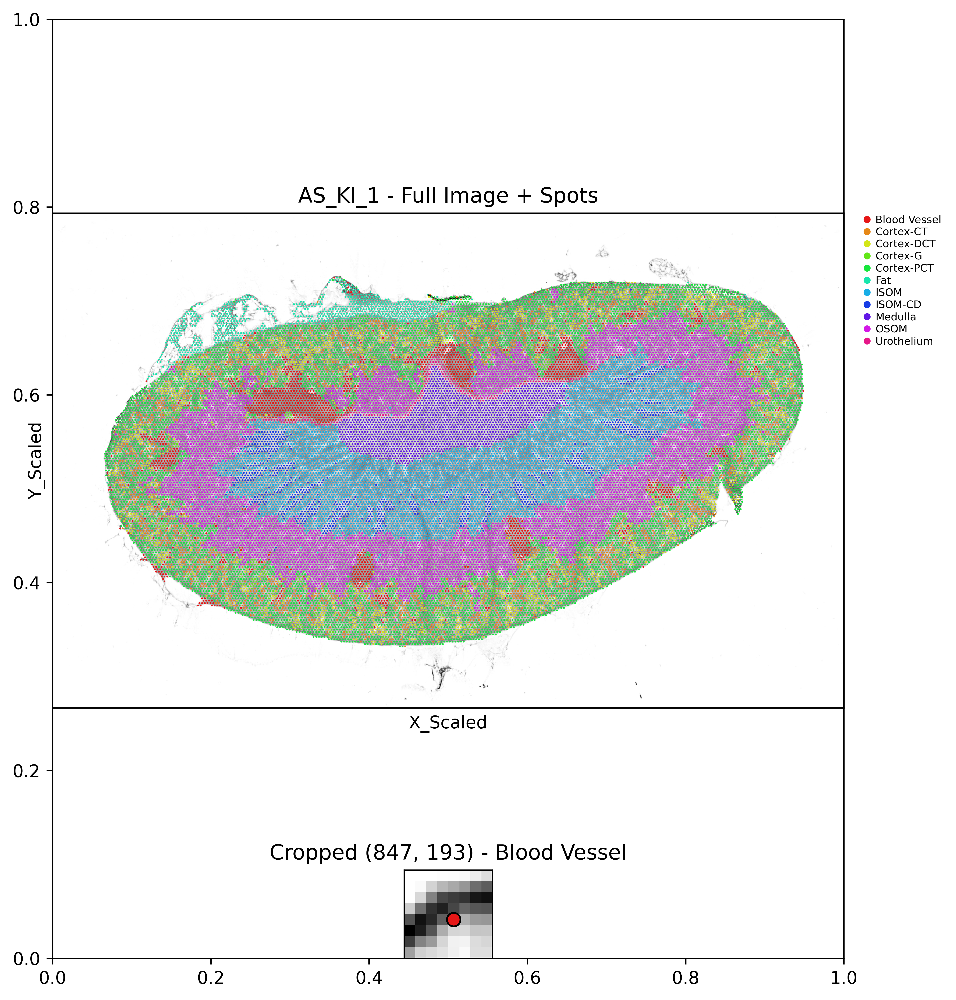

Plotting 7716 cells across 1 samples: ['MOB_1']
Samples found: ['MOB_1']
6 distinct labels found.
Low and high percentiles for 'MOB_1' before if statement: 0.09017372876405716, 0.9927223324775696
Loaded image for sample 'MOB_1' with shape (1899, 1900)
Loaded 1 images.
Samples with images: ['MOB_1']
Loaded 1 images for samples: ['MOB_1']
Plotting 1 samples.
Plotting sample 1/1: MOB_1
Cropped subimage at (529, 369) with diameter 14.901593252108796: shape (14, 14)


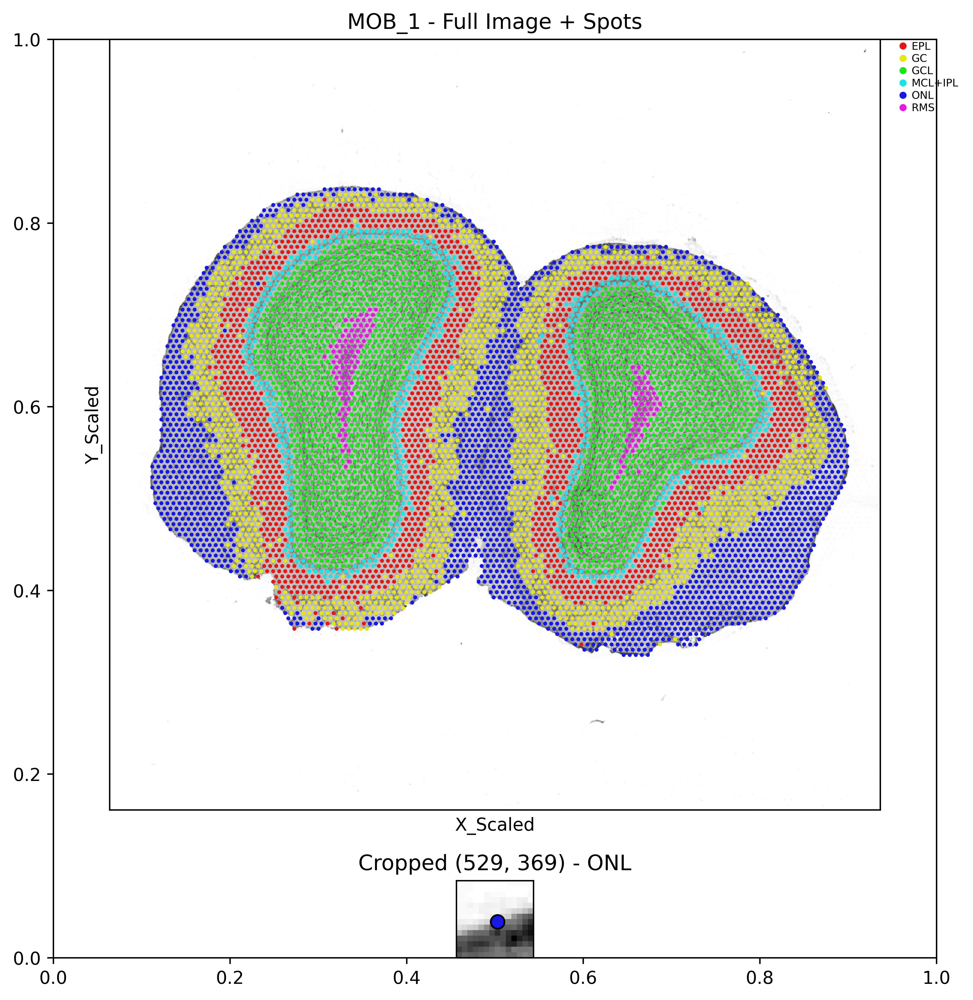

In [8]:
plot_celltype_on_HE(
    adata = combined,
    cell_filter = combined.obs["SampleID"].str.contains("KI", case=False, na=False),
    celltype_col = "Subregion",
    # output_path = dest_dir,
    output_path = "",
    image_dir = HE_dir,
    point_size=1, # 0.08
    title="KI_F3_Subregion",
    legend_title=None,
    fixed_palette=None,
    sample_col="SampleID",
    x_col="X_Scaled",
    y_col="Y_Scaled",
)

plot_celltype_on_HE(
    adata = combined,
    cell_filter = combined.obs["SampleID"].str.contains("MOB", case=False, na=False),
    celltype_col = "Subregion",
    # output_path = dest_dir,
    output_path = "",
    image_dir = HE_dir,
    point_size=5, #0.45
    title="MOB_F2_Subregion",
    legend_title=None,
    fixed_palette=None,
    sample_col="SampleID",
    x_col="X_Scaled",
    y_col="Y_Scaled",
)

In [9]:
def plot_first_five_cropped_subimages(
    adata,
    cell_filter,
    celltype_col,
    image_dir,
    sample_col="Sample_ID",
    x_col="x_scaled_image",
    y_col="y_scaled_image",
    fixed_palette=None,
    point_size=1,
    title="First Five Cropped Subimages",
    legend_title=None,
    legend_fs=6,
    legend_title_fs=6,
    legend_markersize=4
):
    # Subset
    if cell_filter is None or (isinstance(cell_filter, str) and cell_filter.strip() == ""):
        subset = adata.copy()
    elif isinstance(cell_filter, (pd.Series, np.ndarray)):
        subset = adata[cell_filter].copy()
    elif callable(cell_filter):
        mask = cell_filter(adata.obs)
        subset = adata[mask].copy()
    else:
        raise ValueError("cell_filter must be None, a boolean mask, a string, or a callable.")

    subset.obs["subtype"] = subset.obs[celltype_col]
    samples = subset.obs[sample_col].unique().tolist()
    print(f"Plotting {len(subset)} cells across {len(samples)} samples: {samples}")

    # Palette
    if fixed_palette is not None:
        spot_palette = fixed_palette
    else:
        subtypes = subset.obs["subtype"].dropna().unique().tolist()
        spot_palette = distinct_palette(subtypes)

    # Load images
    images = load_grayscale_images(samples, image_dir)
    print(f"Loaded {len(images)} images for samples: {list(images.keys())}")

    # For each sample, crop the first five spots and display only the subimages
    for sample in samples:
        adata_sample = subset[subset.obs[sample_col] == sample].copy()
        sorted_obs = adata_sample.obs.sort_values(by=[y_col, x_col], ascending=[True, True])
        adata_sample.obs = sorted_obs

        img = images[sample]
        n_spots = min(5, len(sorted_obs))
        fig, axs = plt.subplots(1, n_spots, figsize=(2.5 * n_spots, 3))

        for i in range(n_spots):
            x0 = int(sorted_obs[x_col].iloc[i])
            y0 = int(sorted_obs[y_col].iloc[i])
            if len(sorted_obs) > 1:
                diameter = abs(sorted_obs[x_col].iloc[1] - sorted_obs[x_col].iloc[0])
            else:
                diameter = 32  # fallback if only one spot

            half_size = int(diameter // 2)
            x_min = max(x0 - half_size, 0)
            x_max = min(x0 + half_size, img.shape[1])
            y_min = max(y0 - half_size, 0)
            y_max = min(y0 + half_size, img.shape[0])
            subimg = img[y_min:y_max, x_min:x_max]

            subtype = sorted_obs["subtype"].iloc[i]
            spot_color = spot_palette[subtype] if subtype in spot_palette else "red"

            ax = axs[i] if n_spots > 1 else axs
            ax.imshow(subimg, cmap="gray", zorder=0)
            ax.scatter([x0 - x_min], [y0 - y_min], c=[spot_color], s=60, edgecolor="black", zorder=2)
            ax.set_title(f"{subtype}\n({x0},{y0})", fontsize=8)
            ax.set_xticks([]); ax.set_yticks([])

        fig.suptitle(f"{title} - {sample}", fontsize=10)
        plt.tight_layout()
        plt.show()

Plotting 28907 cells across 1 samples: ['AS_KI_1']
11 distinct labels found.
Low and high percentiles for 'AS_KI_1' before if statement: 0.007820392027497292, 0.9028090238571167
Loaded image for sample 'AS_KI_1' with shape (1488, 2381)
Loaded 1 images.
Samples with images: ['AS_KI_1']
Loaded 1 images for samples: ['AS_KI_1']


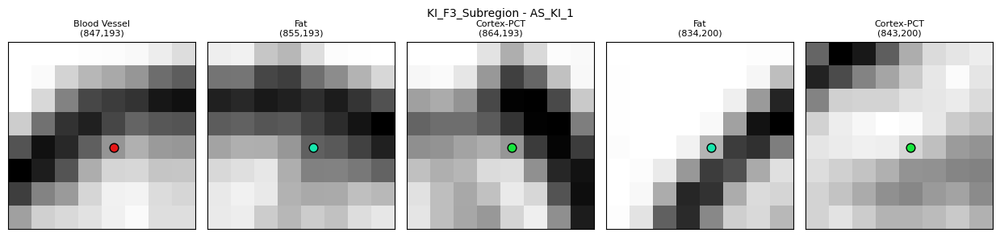

Plotting 7716 cells across 1 samples: ['MOB_1']
6 distinct labels found.
Low and high percentiles for 'MOB_1' before if statement: 0.09017372876405716, 0.9927223324775696
Loaded image for sample 'MOB_1' with shape (1899, 1900)
Loaded 1 images.
Samples with images: ['MOB_1']
Loaded 1 images for samples: ['MOB_1']


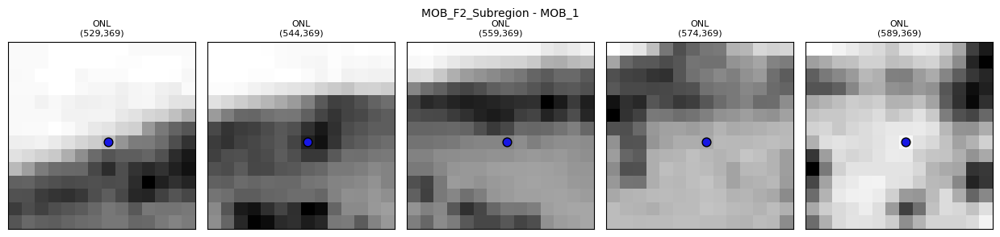

In [10]:
plot_first_five_cropped_subimages(
    adata = combined,
    cell_filter = combined.obs["SampleID"].str.contains("KI", case=False, na=False),
    celltype_col = "Subregion",
    sample_col="SampleID",
    image_dir = HE_dir,
    x_col="X_Scaled",
    y_col="Y_Scaled",
    fixed_palette=None,
    point_size=1, # 0.08
    title="KI_F3_Subregion",
    legend_title=None,
)

plot_first_five_cropped_subimages(
    adata = combined,
    cell_filter = combined.obs["SampleID"].str.contains("MOB", case=False, na=False),
    celltype_col = "Subregion",
    image_dir = HE_dir,
    sample_col="SampleID",
    x_col="X_Scaled",
    y_col="Y_Scaled",
    fixed_palette=None,
    point_size=5, #0.45
    title="MOB_F2_Subregion",
    legend_title=None,
)

# Export Metadata

In [11]:
meta_dir = "/home/jesu3424/EmpiricalBayes/cebmf_seqRNA/data/chevrier/metadata"

if not os.path.exists(meta_dir):
    os.makedirs(meta_dir)
else:
    pass

meta_file = os.path.join(meta_dir, "MOB_KI_metadata.csv")

combined.obs.to_csv(meta_file, sep=",")

# Prepare PyTorch Object

In [12]:
# Convert image to PyTorch tensor (C x H x W) with values in [0, 1]
transform = transforms.Compose([transforms.ToTensor()])

def crop_subimages_make_tensor_list(
    adata,
    cell_filter,
    celltype_col,
    image_dir,
    sample_col="Sample_ID",
    x_col="x_scaled_image",
    y_col="y_scaled_image",
    diameter_fallback=32
):
    """
    Crop subimage under each spot and convert subimage and location label to 
    a PyTorch tensor, returning a list of (subimage, (x_col, y_col)) tensor
    tuples for all samples.
    """
    # Subset
    if cell_filter is None or (isinstance(cell_filter, str) and cell_filter.strip() == ""):
        subset = adata.copy()
    elif isinstance(cell_filter, (pd.Series, np.ndarray)):
        subset = adata[cell_filter].copy()
    elif callable(cell_filter):
        mask = cell_filter(adata.obs)
        subset = adata[mask].copy()
    else:
        raise ValueError("cell_filter must be None, a boolean mask, a string, or a callable.")

    subset.obs["subtype"] = subset.obs[celltype_col]
    samples = subset.obs[sample_col].unique().tolist()
    print(f"Plotting {len(subset)} cells across {len(samples)} samples: {samples}")
    print(f"Samples found: {samples}")

    # Load images
    images = load_grayscale_images(samples, image_dir)
    print(f"Loaded {len(images)} images for samples: {list(images.keys())}")

    # Store results
    tensor_list = []

    for sample in samples:
        adata_sample = subset[subset.obs[sample_col] == sample].copy()
        sorted_obs = adata_sample.obs.sort_values(by=[y_col, x_col], ascending=[True, True])
        adata_sample.obs = sorted_obs

        img = images[sample]
        x_sorted = sorted_obs[x_col].values
        y_sorted = sorted_obs[y_col].values

        # Estimate spot diameter
        if len(x_sorted) > 1:
            diameter = abs(x_sorted[1] - x_sorted[0])
        else:
            diameter = diameter_fallback

        half_size = int(diameter // 2)

        print(f"Cropping {len(sorted_obs)} subimages")
        
        for i in range(len(sorted_obs)):
            x0 = int(x_sorted[i])
            y0 = int(y_sorted[i])
            x_min = max(x0 - half_size, 0)
            x_max = min(x0 + half_size, img.shape[1])
            y_min = max(y0 - half_size, 0)
            y_max = min(y0 + half_size, img.shape[0])
            subimg = img[y_min:y_max, x_min:x_max]

            # Convert subimage and label to PyTorch tensor (shape [1, H, W])
            tensor_img = transform(subimg).unsqueeze(0)
            tensor_label = torch.tensor((x0, y0))
            tensor_list.append((tensor_img, tensor_label))

    return tensor_list

In [13]:
# Define and create the PyTorch Dataset

class SubimageSpotDataset(Dataset):
    """
    PyTorch Dataset for cropped subimages and their (x, y) coordinates.
    Each item is (tensor_img, tensor_label(x, y)).
    """
    def __init__(self, tensor_list):
        self.tensor_list = tensor_list

    def __len__(self):
        return len(self.tensor_list)

    def __getitem__(self, idx):
        return self.tensor_list[idx]

tensor_list_KI = crop_subimages_make_tensor_list(
    adata = combined,
    cell_filter = combined.obs["SampleID"].str.contains("KI", case=False, na=False),
    celltype_col = "Subregion",
    image_dir = HE_dir,
    sample_col="SampleID",
    x_col="X_Scaled",
    y_col="Y_Scaled",
    )

tensor_list_MOB = crop_subimages_make_tensor_list(
    adata = combined,
    cell_filter = combined.obs["SampleID"].str.contains("MOB", case=False, na=False),
    celltype_col = "Subregion",
    image_dir = HE_dir,
    sample_col="SampleID",
    x_col="X_Scaled",
    y_col="Y_Scaled",
    )

dataset_KI = SubimageSpotDataset(tensor_list_KI)
dataset_MOB = SubimageSpotDataset(tensor_list_MOB)

Plotting 28907 cells across 1 samples: ['AS_KI_1']
Samples found: ['AS_KI_1']
Low and high percentiles for 'AS_KI_1' before if statement: 0.007820392027497292, 0.9028090238571167
Loaded image for sample 'AS_KI_1' with shape (1488, 2381)
Loaded 1 images.
Samples with images: ['AS_KI_1']
Loaded 1 images for samples: ['AS_KI_1']
Cropping 28907 subimages
Plotting 7716 cells across 1 samples: ['MOB_1']
Samples found: ['MOB_1']
Low and high percentiles for 'MOB_1' before if statement: 0.09017372876405716, 0.9927223324775696
Loaded image for sample 'MOB_1' with shape (1899, 1900)
Loaded 1 images.
Samples with images: ['MOB_1']
Loaded 1 images for samples: ['MOB_1']
Cropping 7716 subimages


In [14]:
len(dataset_KI)
dataset_KI[3]

(tensor([[[[0.9975, 0.9987, 1.0000, 1.0000, 1.0000, 1.0000, 0.9938, 0.9938],
           [0.9949, 1.0000, 1.0000, 1.0000, 1.0000, 0.9975, 0.9737, 0.8128],
           [0.9971, 1.0000, 1.0000, 1.0000, 0.9990, 0.9527, 0.7088, 0.3732],
           [0.9971, 1.0000, 1.0000, 0.9978, 0.9812, 0.7292, 0.3193, 0.2647],
           [0.9896, 1.0000, 1.0000, 0.9611, 0.7839, 0.4392, 0.4057, 0.6282],
           [1.0000, 0.9896, 0.9376, 0.7034, 0.4411, 0.4964, 0.7535, 0.9088],
           [1.0000, 0.9774, 0.7616, 0.3762, 0.4107, 0.7591, 0.8966, 0.8765],
           [0.9925, 0.9179, 0.5427, 0.3858, 0.6570, 0.8600, 0.8891, 0.7960]]]]),
 tensor([834, 200]))

# Open and visualise raw images (VSI files)

In [15]:
import bioformats
import javabridge

# Start the JVM
javabridge.start_vm(class_path=bioformats.JARS, max_heap_size="512m", run_headless=True,
    args=["-Dorg.slf4j.simpleLogger.defaultLogLevel=error"])

/home/jesu3424/EmpiricalBayes/cebmf_seqRNA/data/chevrier/images/Raw/MOB/MOB_raw/Raw
/home/jesu3424/EmpiricalBayes/cebmf_seqRNA/data/chevrier/images/Raw/KI/KI_raw/Raw
Saved downsampled image size for sample 'MOB_1' with shape (1899, 1900)
Samples with images: ['MOB_1']
Downsampled image sizes: {'MOB_1': (1899, 1900)}
15:25:24.182 [Thread-0] DEBUG loci.formats.ClassList -- Could not find loci.formats.in.URLReader
java.lang.ClassNotFoundException: loci.formats.in.URLReader
	at java.base/jdk.internal.loader.BuiltinClassLoader.loadClass(BuiltinClassLoader.java:581)
	at java.base/jdk.internal.loader.ClassLoaders$AppClassLoader.loadClass(ClassLoaders.java:178)
	at java.base/java.lang.ClassLoader.loadClass(ClassLoader.java:527)
	at java.base/java.lang.Class.forName0(Native Method)
	at java.base/java.lang.Class.forName(Class.java:315)
	at loci.formats.ClassList.parseLine(ClassList.java:196)
	at loci.formats.ClassList.parseFile(ClassList.java:258)
	at loci.formats.ClassList.<init>(ClassList.java

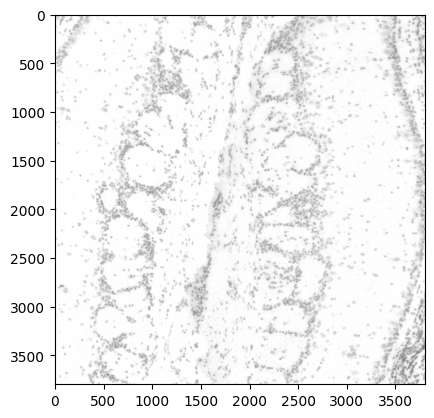

In [20]:
'''
This cell visualises a small section of the raw image slide using javabridge at a 
location roughly the centre of the downsampled tissue.
'''

# HE images
HE_dir = "/home/jesu3424/EmpiricalBayes/cebmf_seqRNA/data/chevrier/images/Downsampled/"

# Raw slide images
raw_img_dir = "/home/jesu3424/EmpiricalBayes/cebmf_seqRNA/data/chevrier/images/Raw/"

# MOB
MOB_dir = os.path.join(raw_img_dir, "MOB/MOB_raw/Raw")
print(MOB_dir)

# Kidneys
KI_dir = os.path.join(raw_img_dir, "KI/KI_raw/Raw")
print(KI_dir)

# Get the downsampled image size
def get_downsamp_img_size(samples, image_dir):
    img_sizes = {}
    for sample in samples:
        path = _resolve_image_path(image_dir, sample)
        if path is None:
            raise FileNotFoundError(f"No image found for sample '{sample}' in {image_dir}")
        img = skimage.io.imread(path)

        # Handle grayscale, RGB, RGBA
        if img.ndim == 2:
            gray = img
        elif img.ndim == 3:
            if img.shape[2] == 4:
                img = skimage.color.rgba2rgb(img)
            gray = skimage.color.rgb2gray(img)
        else:
            raise ValueError(f"Unexpected image shape {img.shape} for '{sample}'")

        gray = img_as_float32(gray)
        
        img_sizes[sample] = gray.shape

        print(f"Saved downsampled image size for sample '{sample}' with shape {gray.shape}")

    print(f"Samples with images: {list(img_sizes.keys())}")

    return img_sizes

# Load VSI image
def _resolve_vsi_path(image_dir, recursive=True):
    """
    Find all .vsi files in the given directory.

    Args:
        directory (str): Path to the directory to search.
        recursive (bool): If True, search subdirectories as well.

    Returns:
        list[str]: List of full paths to .vsi files.
    """
    directory = Path(image_dir)
    
    if recursive:
        files = list(directory.rglob("*.vsi"))
    else:
        files = list(directory.glob("*.vsi"))

    return [str(f.resolve()) for f in files]

def load_vsi_images(image_dir, downsamp_tiff_size, downsamp_cent_coord=(0, 0), downsamp_patch_size=(1024, 1024), channel=0, z_index=0, percentiles=(0, 55)):
    images = []
    paths = _resolve_vsi_path(image_dir, recursive=False)

    if paths is None:
        raise FileNotFoundError(f"No images found in {image_dir}")
    
    for path in paths:
        reader = bioformats.ImageReader(path)

        # Get raw image metadata
        width  = reader.rdr.getSizeX()
        height = reader.rdr.getSizeY()
        channels = reader.rdr.getSizeC()
        zslices  = reader.rdr.getSizeZ()
        timepoints = reader.rdr.getSizeT()
        
        print(f"Full image size: {width} x {height}")
        print(f"Channels: {channels}, Z: {zslices}, T: {timepoints}")

        # Calculate the central location of the sample of interest in the raw slide
        downsamp_rate = round(width / downsamp_tiff_size[0])
        
        print(f"Downsampling rate is {downsamp_rate}")
        
        raw_cent_coord = (downsamp_cent_coord[0] * downsamp_rate, downsamp_cent_coord[1] * downsamp_rate)

        print(f"Downsampled central coordinate: {downsamp_cent_coord}, raw central coordinate: {raw_cent_coord}")
        
        # Crop the corresponding patch: (x, y, width, height)
        raw_half_patch_width = int(downsamp_patch_size[0] // 2 * downsamp_rate / 8)
        raw_half_patch_height = int(downsamp_patch_size[1] // 2 * downsamp_rate / 8)

        print(f"half_width * half_height for patch in raw slide is {raw_half_patch_width} * {raw_half_patch_height}")

        x = max(raw_cent_coord[0] - raw_half_patch_width, 0)
        y = max(raw_cent_coord[1] - raw_half_patch_height, 0)
        w = int(downsamp_patch_size[0] * downsamp_rate / 8)
        h = int(downsamp_patch_size[1] * downsamp_rate / 8) 

        patch = reader.read(z=0, t=0, series=0, XYWH=(x, y, w, h))  # NumPy array
        print(f"Shape of one region is {patch.shape}")

        # Handle grayscale, RGB, RGBA
        if patch.ndim == 2:
            gray = patch
        elif patch.ndim == 3:
            if patch.shape == 4:
                patch = skimage.color.rgba2rgb(patch)
            gray = skimage.color.rgb2gray(patch)
        else:
            raise ValueError(f"Unexpected image shape {patch.shape}")

        gray = img_as_float32(gray)

        if percentiles is not None:
            low, high = np.percentile(gray, percentiles)
            if not np.isfinite(low) or not np.isfinite(high) or high <= low:
                low, high = np.min(gray), np.max(gray)
            gray = skimage.exposure.rescale_intensity(gray, in_range=(low, high))

        # Rotate the image by 90 degrees
        gray_temp = gray.copy()
        gray_rot = np.rot90(gray_temp, k=-1)
        plt.imshow(gray_rot, cmap="gray") 
        
        images.append(gray_rot)

        print(f"Loaded the first patch with shape {gray_rot.shape}")
        
        reader.close()

    return images

# list of samples
MOB_samples = ['MOB_1']

# Get the size of downsampled images
downsamp_img_sizes = get_downsamp_img_size(samples=MOB_samples, image_dir=HE_dir)
print(f"Downsampled image sizes: {downsamp_img_sizes}")

# Specify size of downsampled .tiff image and central coordinate of the tissue of interest in the downsampled .tiff image
downsamp_tiff_size = (9695, 3838)
downsamp_cent_coord = (5028, 2664)

# Load MOB images
for key, value in downsamp_img_sizes.items():
    images_MOB = load_vsi_images(MOB_dir, downsamp_tiff_size, downsamp_cent_coord, downsamp_patch_size=value)

# Load KI images
# images_KI = load_vsi_images(KI_dir)


In [ ]:
images_MOB

In [35]:
'''
This cell scales the X and Y coordinates from the downsampled tissue image to the raw slide image,
finds subimages equivalent to the part of the tissue beneath the spots in the downsampled tissue image,
and saves them to file, named in row major order.
'''

# HE images
HE_dir = "/home/jesu3424/EmpiricalBayes/cebmf_seqRNA/data/chevrier/images/Downsampled/"

# Raw slide images
raw_img_dir = "/home/jesu3424/EmpiricalBayes/cebmf_seqRNA/data/chevrier/images/Raw/"

# MOB
MOB_dir = os.path.join(raw_img_dir, "MOB/MOB_raw/Raw")
print(MOB_dir)

# Kidneys
KI_dir = os.path.join(raw_img_dir, "KI/KI_raw/Raw")
print(KI_dir)

# Directories to save the raw subimages
MOB_subimg_dir = os.path.join(MOB_dir, "Subimages")
print(MOB_subimg_dir)

KI_subimg_dir = os.path.join(KI_dir, "Subimages")
print(KI_subimg_dir)

# Get the downsampled image size
def get_downsamp_img_size(samples, image_dir):
    img_sizes = {}
    for sample in samples:
        path = _resolve_image_path(image_dir, sample)
        if path is None:
            raise FileNotFoundError(f"No image found for sample '{sample}' in {image_dir}")
        img = skimage.io.imread(path)

        # Handle grayscale, RGB, RGBA
        if img.ndim == 2:
            gray = img
        elif img.ndim == 3:
            if img.shape[2] == 4:
                img = skimage.color.rgba2rgb(img)
            gray = skimage.color.rgb2gray(img)
        else:
            raise ValueError(f"Unexpected image shape {img.shape} for '{sample}'")

        gray = img_as_float32(gray)
        
        img_sizes[sample] = gray.shape

        print(f"Saved downsampled image size for sample '{sample}' with shape {gray.shape}")

    print(f"Samples with images: {list(img_sizes.keys())}")

    return img_sizes

def get_downsamp_subimage_size_and_coords(
    adata,
    cell_filter,
    celltype_col,
    output_path,
    image_dir,
    point_size=1,
    title="",
    legend_title=None,
    fixed_palette=None,
    sample_col="Sample_ID",
    x_col="x_scaled_image",
    y_col="y_scaled_image",
):
    # Subset
    if cell_filter is None or (isinstance(cell_filter, str) and cell_filter.strip() == ""):
        subset = adata.copy()
    elif isinstance(cell_filter, (pd.Series, np.ndarray)):
        subset = adata[cell_filter].copy()
    elif callable(cell_filter):
        mask = cell_filter(adata.obs)
        subset = adata[mask].copy()
    else:
        raise ValueError("cell_filter must be None, a boolean mask, a string, or a callable.")

    subset.obs["subtype"] = subset.obs[celltype_col]
    samples = subset.obs[sample_col].unique().tolist()
    print(f"Plotting {len(subset)} cells across {len(samples)} samples: {samples}")
    print(f"Samples found: {samples}")
    
    # Load images
    images = load_grayscale_images(samples, image_dir)
    print(f"Loaded {len(images)} images for samples: {list(images.keys())}")

    # Get the number of samples inquired
    n = len(samples)
    print(f"Plotting {n} samples.")

    subimage_diam = {}
    subimage_x_sorted = {}
    subimage_y_sorted = {}
    
    # Get the size and coordinates for each sample
    for i, sample in enumerate(samples):
        print(f"Plotting sample {i+1}/{n}: {sample}")
        adata_sample = subset[subset.obs[sample_col] == sample].copy()
        sorted_obs = adata_sample.obs.sort_values(by=[y_col, x_col], ascending=[True, True])
        adata_sample.obs = sorted_obs
    
        # Calculate diameter and crop subimage
        x_sorted = sorted_obs[x_col].values
        y_sorted = sorted_obs[y_col].values
        if len(x_sorted) > 1:
            diameter = abs(x_sorted[1] - x_sorted[0])
        else:
            diameter = 32  # fallback if only one spot

        subimage_diam.update({sample: diameter})
        subimage_x_sorted.update({sample: x_sorted})
        subimage_y_sorted.update({sample: y_sorted})

    print(f"Diameters: {subimage_diam}")
    print(f"Sorted x_coords: {subimage_x_sorted}")
    print(f"Sorted y_coords: {subimage_y_sorted}")

    return subimage_diam, subimage_x_sorted, subimage_y_sorted

# Load VSI image
def _resolve_vsi_path(image_dir, recursive=True):
    """
    Find all .vsi files in the given directory.

    Args:
        directory (str): Path to the directory to search.
        recursive (bool): If True, search subdirectories as well.

    Returns:
        list[str]: List of full paths to .vsi files.
    """
    directory = Path(image_dir)
    
    if recursive:
        files = list(directory.rglob("*.vsi"))
    else:
        files = list(directory.glob("*.vsi"))

    return [str(f.resolve()) for f in files]

def save_vsi_subimages_to_file(
    image_dir, 
    downsamp_tiff_size, 
    downsamp_cent_coord, 
    downsamp_tissue_size,
    downsamp_patch_size,
    downsamp_x_coords, 
    downsamp_y_coords,
    output_path = None,
    channel=0, 
    z_index=0, 
    percentiles=(0, 55),
):
    paths = _resolve_vsi_path(image_dir, recursive=False)

    if paths is None:
        raise FileNotFoundError(f"No images found in {image_dir}")
    
    for path in paths:
        reader = bioformats.ImageReader(path)

        # Get raw image metadata
        width  = reader.rdr.getSizeX()
        height = reader.rdr.getSizeY()
        channels = reader.rdr.getSizeC()
        zslices  = reader.rdr.getSizeZ()
        timepoints = reader.rdr.getSizeT()
        
        print(f"Full image size: {width} x {height}")
        print(f"Channels: {channels}, Z: {zslices}, T: {timepoints}")

        # Calculate the central location of the sample of interest in the raw slide
        downsamp_rate = round(width / downsamp_tiff_size[0])
        
        print(f"Downsampling rate is {downsamp_rate}")
        
        raw_cent_coord = (downsamp_cent_coord[0] * downsamp_rate, downsamp_cent_coord[1] * downsamp_rate)

        print(f"Downsampled central coordinate: {downsamp_cent_coord}, raw central coordinate: {raw_cent_coord}")
        
        # Calculate the size of the subimage in the raw slide image
        raw_half_patch_size = int(downsamp_patch_size // 2 * downsamp_rate)

        print(f"half_size for subimage in the raw slide is {raw_half_patch_size}")

        # Calculate the size of the corresponding tissue in the raw slide image
        raw_half_tissue_width = int(downsamp_tissue_size[0] // 2 * downsamp_rate)
        raw_half_tissue_height = int(downsamp_tissue_size[1] // 2 * downsamp_rate)

        print(f"half_width * half_height for corresponding tissue in the raw slide is {raw_half_tissue_width} * {raw_half_tissue_height}")

        # Calculate the start location of the corresponding tissue in the raw slide image
        x_tissue_min = max(raw_cent_coord[0] - raw_half_tissue_width, 0)
        y_tissue_min = max(raw_cent_coord[1] - raw_half_tissue_height, 0)
        
        print(f"Start location of the corresponding tissue in the raw slide is ({x_tissue_min}, {y_tissue_min})")
        
        # Calculate the scaled X and Y coordinates in the raw slide image
        raw_x_coords = downsamp_x_coords * downsamp_rate
        raw_y_coords = downsamp_y_coords * downsamp_rate

        # The number of submiages that need to be saved
        n_spots = len(downsamp_x_coords)

        print(f"Number of subimages that need to be saved: {n_spots}")

        for i in range(n_spots):

            # Get the relative central coordinates for each subimage
            x0 = raw_x_coords[i]
            y0 = raw_y_coords[i]

            # Calculate the parameters required to crop the corresponding subimage: (x, y, width, height)
            x_min = max(x0 - raw_half_patch_size + x_tissue_min, 0)
            y_min = max(y0 - raw_half_patch_size + y_tissue_min, 0)
            w, h = [raw_half_patch_size * 2 for _ in range(2)]

            # Crop the corresponding subimage: (x, y, width, height)
            subimg = reader.read(z=0, t=0, series=0, XYWH=(x_min, y_min, w, h))  # NumPy array

            # Handle grayscale, RGB, RGBA
            if subimg.ndim == 2:
                gray = subimg
            elif subimg.ndim == 3:
                if subimg.shape == 4:
                    subimg = skimage.color.rgba2rgb(subimg)
                gray = skimage.color.rgb2gray(subimg)
            else:
                raise ValueError(f"Unexpected image shape {subimg.shape}")
    
            gray = img_as_float32(gray)
    
            if percentiles is not None:
                low, high = np.percentile(gray, percentiles)
                if not np.isfinite(low) or not np.isfinite(high) or high <= low:
                    low, high = np.min(gray), np.max(gray)
                gray = skimage.exposure.rescale_intensity(gray, in_range=(low, high))
    
            # Rotate the image by 90 degrees
            gray_temp = gray.copy()
            gray_rot = np.rot90(gray_temp, k=-1)

            # If array is float, scale to 0-255 and convert to uint8
            if gray_rot.dtype != np.uint8:
                gray_rot = (255 * (gray_rot - gray_rot.min()) / (gray_rot.ptp() + 1e-8)).astype(np.uint8)

            # Save subimage to output_path
            os.makedirs(output_path, exist_ok=True)
            img = Image.fromarray(gray_rot)
            filename = os.path.join(output_path, f"image_{i}.png")
            img.save(filename)
            
        reader.close()

    return 0

# list of samples
MOB_samples = ['MOB_1']

# Get the size of downsampled tissue images
downsamp_img_sizes = get_downsamp_img_size(samples=MOB_samples, image_dir=HE_dir)
print(f"Downsampled image sizes: {downsamp_img_sizes}")

# Get the size of downsampled subimages within a tissue and X/Y coordinates
downsamp_subimg_sizes, downsamp_x_coords, downsamp_y_coords = get_downsamp_subimage_size_and_coords(
    adata = combined,
    cell_filter = combined.obs["SampleID"].str.contains("MOB", case=False, na=False),
    celltype_col = "Subregion",
    # output_path = dest_dir,
    output_path = "",
    image_dir = HE_dir,
    point_size=5, #0.45
    title="MOB_F2_Subregion",
    legend_title=None,
    fixed_palette=None,
    sample_col="SampleID",
    x_col="X_Scaled",
    y_col="Y_Scaled",
)

# Specify size of downsampled .tiff image and central coordinate of the tissue of interest in the downsampled .tiff image
downsamp_tiff_size = (9695, 3838)
downsamp_cent_coord = (5028, 2664)

# Save subimages from raw microscope images to file 
for sample in MOB_samples:
    save_vsi_subimages_to_file(
        MOB_dir, 
        downsamp_tiff_size, 
        downsamp_cent_coord, 
        downsamp_img_sizes.get(sample), 
        downsamp_subimg_sizes.get(sample), 
        downsamp_x_coords.get(sample), 
        downsamp_y_coords.get(sample),
        output_path = MOB_subimg_dir,
    )

# Load KI images
# images_KI = load_vsi_images(KI_dir)


/home/jesu3424/EmpiricalBayes/cebmf_seqRNA/data/chevrier/images/Raw/MOB/MOB_raw/Raw
/home/jesu3424/EmpiricalBayes/cebmf_seqRNA/data/chevrier/images/Raw/KI/KI_raw/Raw
/home/jesu3424/EmpiricalBayes/cebmf_seqRNA/data/chevrier/images/Raw/MOB/MOB_raw/Raw/Subimages
/home/jesu3424/EmpiricalBayes/cebmf_seqRNA/data/chevrier/images/Raw/KI/KI_raw/Raw/Subimages
Saved downsampled image size for sample 'MOB_1' with shape (1899, 1900)
Samples with images: ['MOB_1']
Downsampled image sizes: {'MOB_1': (1899, 1900)}
Plotting 7716 cells across 1 samples: ['MOB_1']
Samples found: ['MOB_1']
Low and high percentiles for 'MOB_1' before if statement: 0.09017372876405716, 0.9927223324775696
Loaded image for sample 'MOB_1' with shape (1899, 1900)
Loaded 1 images.
Samples with images: ['MOB_1']
Loaded 1 images for samples: ['MOB_1']
Plotting 1 samples.
Plotting sample 1/1: MOB_1
Diameters: {'MOB_1': 14.901593252108796}
Sorted x_coords: {'MOB_1': array([ 529.53420806,  544.43580131,  559.33739456, ..., 1296.96626

In [ ]:
# Kill the JVM
# javabridge.kill_vm()